<a href="https://colab.research.google.com/" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Synthetic CNV Image Classifier

이 노트북은 OCT2017 데이터셋의 CNV 이미지를 사용하여 Stable Diffusion 모델로 Synthetic CNV 이미지를 생성하고, 이를 Normal CNV 이미지와 다양한 비율(0%~100%)로 혼합하여 Classifier를 학습시킵니다. 목표는 Synthetic 이미지의 최적 비율을 찾아 Classifier 성능을 최대화하는 것입니다.

**실행 순서**:
1. 데이터 전처리: OCT2017 CNV/NORMAL 이미지 → ViT 임베딩 → `pre-trained_dataset.pt`.
2. Diffusion Model 파인튜닝: Stable Diffusion UNet을 CNV 이미지로 학습.
3. Synthetic CNV 이미지 생성: 파인튜닝된 모델로 이미지 생성 → ViT 임베딩 → `synthetic_cnv_dataset.pt`.
4. 비율별 Classifier 학습: Synthetic 비율 0%~100%로 데이터 혼합 → Classifier 학습 → 성능 비교.

**실행 환경**: Google Colab (GPU, 예: T4 또는 A100 권장).

## 1. 환경 설정 및 패키지 설치

필요한 Python 패키지를 설치하고, 랜덤 시드를 설정하여 재현성을 보장합니다. GPU를 사용하며, 메모리 관리를 위한 함수도 정의합니다.

In [1]:
!pip install kagglehub torch torchvision transformers diffusers accelerate datasets xformers pytorch-fid pandas
import os
import gc
import torch
import numpy as np
import random
from PIL import Image
import pandas as pd
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset, TensorDataset
from transformers import ViTModel, CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler, StableDiffusionPipeline
from accelerate import Accelerator
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
from pytorch_fid import fid_score

# 랜덤 시드 설정
seed = 123
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
random.seed(seed)

# GPU 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# 메모리 정리 함수
def clear_memory():
    gc.collect()
    torch.cuda.empty_cache()

## 2. 데이터 전처리: OCT2017 데이터셋 → ViT 임베딩

OCT2017 데이터셋의 CNV 및 NORMAL 이미지를 로드하고, ViT 모델을 사용하여 임베딩을 생성합니다. 결과는 `pre-trained_dataset.pt` 파일로 저장됩니다.

In [2]:
def img_transform():
    return transforms.Compose([
        transforms.Lambda(lambda img: img.crop((0, 100, 768, 400))),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

def vit_process(img_list, batch_size=16):
    model_name = "google/vit-base-patch16-224"
    vit_model = ViTModel.from_pretrained(model_name, output_hidden_states=True).to(device)
    vit_model.eval()
    length = len(img_list)
    layers_0, layers_1, layers_2, layers_3 = [], [], [], []
    for i in range(int(length/batch_size)):
        batch_imgs = img_list[i*batch_size:(i+1)*batch_size]
        batch_tensor = torch.stack(batch_imgs, dim=0).to(device)
        with torch.no_grad():
            outputs = vit_model(pixel_values=batch_tensor)
        hidden = outputs.hidden_states
        last_layer = hidden[12][:,0,:]
        hidden_layer_1 = torch.zeros_like(last_layer)
        hidden_layer_2 = torch.zeros_like(last_layer)
        hidden_layer_3 = torch.zeros_like(last_layer)
        for j in range(12):
            if j < 4:
                hidden_layer_1 += hidden[j][:,0,:]/4
            elif j < 8:
                hidden_layer_2 += hidden[j][:,0,:]/4
            else:
                hidden_layer_3 += hidden[j][:,0,:]/4
        layers_0.append(last_layer)
        layers_1.append(hidden_layer_1)
        layers_2.append(hidden_layer_2)
        layers_3.append(hidden_layer_3)
        clear_memory()
    return (torch.cat(layers_0, dim=0), torch.cat(layers_1, dim=0),
            torch.cat(layers_2, dim=0), torch.cat(layers_3, dim=0))

def load_trans(path, pic_num=640):
    trans_toTensor = img_transform()
    image_list = []
    i = 0
    for filename in os.listdir(path):
        if i == pic_num:
            break
        file_path = os.path.join(path, filename)
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            try:
                img = Image.open(file_path).convert("RGB")
                tensor_img = trans_toTensor(img)
                image_list.append(tensor_img)
            except Exception as e:
                print(f"Skip: {filename}, Error: {e}")
        i += 1
    return image_list

def preprocess_data():
    print("Data Preprocessing: Start!")
    import kagglehub
    path = kagglehub.dataset_download("paultimothymooney/kermany2018")
    loadpath = os.path.join(path, "OCT2017 /train")
    train_path_cnv = os.path.join(loadpath, "CNV")
    train_path_normal = os.path.join(loadpath, "NORMAL")

    cnv_tensor_list = load_trans(train_path_cnv)
    normal_tensor_list = load_trans(train_path_normal)
    out_00, out_01, out_02, out_03 = vit_process(cnv_tensor_list)
    out_10, out_11, out_12, out_13 = vit_process(normal_tensor_list)

    batch_size, batch_num, half_batch = 128, 10, 64
    tensor_list_0, tensor_list_1, tensor_list_2, tensor_list_3, labels_list = [], [], [], [], []
    for i in range(batch_num):
        cnv_tensor_0 = out_00[i*half_batch:(i+1)*half_batch]
        norm_tensor_0 = out_10[i*half_batch:(i+1)*half_batch]
        cnv_tensor_1 = out_01[i*half_batch:(i+1)*half_batch]
        norm_tensor_1 = out_11[i*half_batch:(i+1)*half_batch]
        cnv_tensor_2 = out_02[i*half_batch:(i+1)*half_batch]
        norm_tensor_2 = out_12[i*half_batch:(i+1)*half_batch]
        cnv_tensor_3 = out_03[i*half_batch:(i+1)*half_batch]
        norm_tensor_3 = out_13[i*half_batch:(i+1)*half_batch]
        tensor_0 = torch.cat((cnv_tensor_0, norm_tensor_0), dim=0)
        tensor_1 = torch.cat((cnv_tensor_1, norm_tensor_1), dim=0)
        tensor_2 = torch.cat((cnv_tensor_2, norm_tensor_2), dim=0)
        tensor_3 = torch.cat((cnv_tensor_3, norm_tensor_3), dim=0)
        labels = torch.cat([torch.zeros(half_batch, dtype=torch.long), torch.ones(half_batch, dtype=torch.long)], dim=0)
        indices = torch.randperm(batch_size)
        tensor_list_0.append(tensor_0[indices])
        tensor_list_1.append(tensor_1[indices])
        tensor_list_2.append(tensor_2[indices])
        tensor_list_3.append(tensor_3[indices])
        labels_list.append(labels[indices])
    tensor_set_0 = torch.cat(tensor_list_0, dim=0)
    tensor_set_1 = torch.cat(tensor_list_1, dim=0)
    tensor_set_2 = torch.cat(tensor_list_2, dim=0)
    tensor_set_3 = torch.cat(tensor_list_3, dim=0)
    labels_set = torch.cat(labels_list, dim=0)

    if os.path.exists('pre-trained_dataset.pt'):
        os.remove('pre-trained_dataset.pt')
    torch.save({'data_0': tensor_set_0, 'data_1': tensor_set_1, 'data_2': tensor_set_2, 'data_3': tensor_set_3, 'label': labels_set}, 'pre-trained_dataset.pt')
    print('Data Preprocessing: Done!')

preprocess_data()
clear_memory()

Data Preprocessing: Start!


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably T

Data Preprocessing: Done!


## 3. Diffusion Model 파인튜닝

Stable Diffusion 모델의 UNet을 CNV 이미지로 파인튜닝합니다. Kaggle 데이터셋을 다운로드하고, CNV 이미지를 전처리하여 학습에 사용합니다. 학습된 모델은 `/content/models/sd_cnv_finetuned`에 저장됩니다.

### 3.1 데이터 준비

Kaggle 데이터셋에서 CNV 이미지를 다운로드하고, 512x512 크기로 리사이징하여 `/content/processed/CNV/`에 저장합니다.

In [3]:
import kagglehub
import os
from PIL import Image

def prepare_cnv_images():
    # Kaggle 데이터셋 다운로드
    path = kagglehub.dataset_download("paultimothymooney/kermany2018")
    print(f"Dataset downloaded to: {path}")

    # 데이터셋 경로 설정 및 CNV 이미지 복사
    in_dir = os.path.join(path, "OCT2017 /train/CNV")
    out_dir = "/content/processed/CNV/"
    os.makedirs(out_dir, exist_ok=True)
    for fn in os.listdir(in_dir):
        img = Image.open(os.path.join(in_dir, fn)).convert("RGB")
        img = img.resize((512, 512), resample=Image.LANCZOS)
        img.save(os.path.join(out_dir, fn))
    print(f"Processed CNV images saved to {out_dir}")

prepare_cnv_images()

Dataset downloaded to: /kaggle/input/kermany2018
Processed CNV images saved to /content/processed/CNV/


### 3.2 데이터셋 클래스 정의

`ImgDataset` 클래스를 정의하여 CNV 이미지를 로드하고, 학습에 필요한 형식으로 변환합니다.

In [4]:
from torch.utils.data import Dataset
from torchvision import transforms

class ImgDataset(Dataset):
    def __init__(self, root_dir:str, tokenizer, cohort:str = "CNV", resolution=512, max_length=77, dataset_size:int = 6400) -> None:
        self.files = [
            os.path.join(root_dir, f)
            for f in os.listdir(root_dir)
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        ]
        if len(self.files) > dataset_size: self.files = self.files[:dataset_size]
        self.tokenizer = tokenizer
        self.transform = transforms.Compose([
            transforms.Resize((resolution, resolution), transforms.InterpolationMode.LANCZOS),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5]),
        ])
        self.prompt = f"OCT scan showing {cohort}"
        self.max_length = max_length

    def __len__(self) -> int:
        return len(self.files)

    def __getitem__(self, idx:int) -> dict:
        img = Image.open(self.files[idx]).convert("RGB")
        img = self.transform(img)
        tokens = self.tokenizer(
            self.prompt,
            padding="max_length",
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt"
        )
        return {"pixel_values": img, "input_ids": tokens.input_ids.squeeze(0)}

### 3.3 학습 함수 정의

`train` 함수를 정의하여 Stable Diffusion UNet을 CNV 이미지로 파인튜닝합니다. 혼합 정밀도 학습과 체크포인트 저장을 지원합니다.

In [5]:
import torch
from torch.utils.data import DataLoader
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler
from transformers import CLIPTextModel, CLIPTokenizer
from accelerate import Accelerator

def train(
    pretrained_model: str,
    data_dir: str,
    output_dir: str = "sd_cnv_finetuned",
    cohort: str = "CNV",
    resolution: int = 512,
    dataset_size: int = 6400,
    batch_size: int = 4,
    learning_rate: float = 1e-4,
    epochs: int = 5,
    grad_accum_steps: int = 1,
    save_steps: int = 1000,
    resume_checkpoint: str = None,
    unet: UNet2DConditionModel = None,
    accelerator: Accelerator = None,
):
    # 1) Prepare output directory, accelerator & device
    os.makedirs(output_dir, exist_ok=True)
    accel = accelerator or Accelerator()
    device = accel.device

    # 2) Load or resume UNet
    if resume_checkpoint and unet is None:
        unet = UNet2DConditionModel.from_pretrained(resume_checkpoint).to(device)
    elif unet is None:
        unet = UNet2DConditionModel.from_pretrained(pretrained_model, subfolder="unet").to(device)

    # 3) Load & freeze tokenizer + text encoder
    tokenizer = CLIPTokenizer.from_pretrained(pretrained_model, subfolder="tokenizer")
    text_encoder = CLIPTextModel.from_pretrained(pretrained_model, subfolder="text_encoder").to(device)
    text_encoder.requires_grad_(False)

    # 4) Load & freeze VAE
    vae = AutoencoderKL.from_pretrained(pretrained_model, subfolder="vae").to(device)
    vae.requires_grad_(False)

    # 5) Load noise scheduler
    scheduler = DDPMScheduler.from_pretrained(pretrained_model, subfolder="scheduler")

    # 6) Prepare dataset & dataloader
    dataset = ImgDataset(data_dir, tokenizer, cohort=cohort, resolution=resolution, dataset_size=dataset_size)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # 7) Optimizer (only UNet params)
    optimizer = torch.optim.AdamW(unet.parameters(), lr=learning_rate)

    # 8) Wrap models, optimizer, and dataloader for mixed-precision / distributed
    unet, optimizer, dataloader = accel.prepare(unet, optimizer, dataloader)

    # 9) Resume state if requested
    if resume_checkpoint:
        accel.load_state(resume_checkpoint)
        global_step = int(resume_checkpoint.rsplit("_", 1)[-1])
    else:
        global_step = 0

    # 10) Training loop
    for epoch in range(1, epochs + 1):
        unet.train()
        for batch in dataloader:
            with accel.accumulate(unet):
                # Encode images to latents
                pixels = batch["pixel_values"].to(device)
                latents = vae.encode(pixels).latent_dist.sample() * 0.18215

                # Add noise
                noise = torch.randn_like(latents)
                timesteps = torch.randint(0, scheduler.config.num_train_timesteps, (latents.shape[0],), device=device)
                noisy_latents = scheduler.add_noise(latents, noise, timesteps)

                # Text conditioning
                input_ids = batch["input_ids"].to(device)
                encoder_hidden_states = text_encoder(input_ids)[0]

                # Noise prediction & loss
                pred_noise = unet(noisy_latents, timesteps, encoder_hidden_states).sample
                loss = torch.nn.functional.mse_loss(pred_noise, noise)

                # Backpropagate
                accel.backward(loss)
                optimizer.step()
                optimizer.zero_grad()

            global_step += 1
            if global_step % save_steps == 0:
                accel.wait_for_everyone()
                ckpt_dir = os.path.join(output_dir, f"checkpoint_{global_step}")
                unet.save_pretrained(ckpt_dir)
                if accel.is_main_process:
                    tokenizer.save_pretrained(ckpt_dir)
                accel.save_state(ckpt_dir)

        print(f"Epoch {epoch}/{epochs} complete")

    # 11) Final save
    accel.wait_for_everyone()
    final_dir = os.path.join(output_dir, "final_unet")
    unet.save_pretrained(final_dir)
    if accel.is_main_process:
        tokenizer.save_pretrained(output_dir)
    print("Fine-tuning complete — models saved to", output_dir)

### 3.4 Diffusion Model 학습 실행

미리 학습된 모델(`nota-ai/bk-sdm-small`)을 사용하여 CNV 이미지로 파인튜닝을 실행합니다.

In [6]:
from accelerate import Accelerator

# Accelerator 초기화
accel = Accelerator()

# Diffusion Model 학습 실행
train(
    pretrained_model="nota-ai/bk-sdm-small",
    data_dir="/content/processed/CNV",
    output_dir="/content/models/sd_cnv_finetuned",
    cohort="CNV",
    resolution=512,
    dataset_size=500,  # 학습 시간 고려
    batch_size=4,
    learning_rate=1e-4,
    epochs=10,
    grad_accum_steps=1,
    save_steps=1000,
    resume_checkpoint=None,
    accelerator=accel
)

# 메모리 정리
clear_memory()

config.json:   0%|          | 0.00/1.51k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.93G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

Epoch 1/10 complete
Epoch 2/10 complete
Epoch 3/10 complete
Epoch 4/10 complete
Epoch 5/10 complete
Epoch 6/10 complete
Epoch 7/10 complete
Epoch 8/10 complete
Epoch 9/10 complete
Epoch 10/10 complete
Fine-tuning complete — models saved to /content/models/sd_cnv_finetuned


## 4. Synthetic CNV 이미지 생성

파인튜닝된 Diffusion Model을 사용하여 Synthetic CNV 이미지를 생성하고, ViT 임베딩을 생성하여 `synthetic_cnv_dataset.pt`로 저장합니다.

In [7]:
# 셀 10: Synthetic CNV 이미지 생성
def generate_synthetic_images():
    # 원본 모델에서 기본 파이프라인 로드
    pipeline = StableDiffusionPipeline.from_pretrained(
        "nota-ai/bk-sdm-small",
        torch_dtype=torch.float16,
        use_auth_token=False
    ).to(device)

    # 파인튜닝된 UNet 로드
    unet = UNet2DConditionModel.from_pretrained(
        "/content/models/sd_cnv_finetuned/final_unet",
        torch_dtype=torch.float16
    ).to(device)

    # 파이프라인의 UNet 교체
    pipeline.unet = unet

    # Synthetic 이미지 생성
    synthetic_dir = "/content/synthetic_cnv/"
    os.makedirs(synthetic_dir, exist_ok=True)
    num_images = 640
    prompt = "OCT scan showing CNV"

    for i in range(num_images):
        image = pipeline(prompt, num_inference_steps=50).images[0]
        image.save(os.path.join(synthetic_dir, f"synthetic_cnv_{i}.png"))
        if i % 50 == 0:
            print(f"Generated {i}/{num_images} images")
        clear_memory()

    # Synthetic 이미지 ViT 임베딩 생성
    synthetic_tensor_list = load_trans(synthetic_dir, pic_num=num_images)
    out_00, out_01, out_02, out_03 = vit_process(synthetic_tensor_list)

    # synthetic_cnv_dataset.pt 저장
    if os.path.exists('synthetic_cnv_dataset.pt'):
        os.remove('synthetic_cnv_dataset.pt')
    torch.save({
        'data_0': out_00,
        'data_1': out_01,
        'data_2': out_02,
        'data_3': out_03,
        'label': torch.zeros(num_images, dtype=torch.long)
    }, 'synthetic_cnv_dataset.pt')
    print("Synthetic CNV dataset saved to synthetic_cnv_dataset.pt")

generate_synthetic_images()
clear_memory()

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

Keyword arguments {'use_auth_token': False} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 0/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 50/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 100/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 150/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 200/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 250/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 300/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 350/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 400/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 450/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 500/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 550/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 600/640 images


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Synthetic CNV dataset saved to synthetic_cnv_dataset.pt


## 5. Classifier 모델 정의

ViT 임베딩을 입력으로 받아 CNV와 NORMAL을 분류하는 Classifier 모델을 정의합니다.

In [10]:
import torch.nn as nn
import torch.nn.init as init
import abc

class TransformerBlock(nn.Module):
    def __init__(self, input_size, head_num=10):
        super(TransformerBlock, self).__init__()
        self.input_size = input_size
        self.head_num = head_num
        self.query = nn.Linear(input_size, input_size)
        self.key = nn.Linear(input_size, input_size)
        self.value = nn.Linear(input_size, input_size)
        self.multihead = nn.MultiheadAttention(input_size, head_num)
        self.dropout = nn.Dropout(0.3)
        self.norm = nn.LayerNorm(input_size)
        self.linear = nn.Linear(input_size, input_size)

    def forward(self, q, k, v):
        q = self.query(q)
        k = self.key(k)
        v = self.value(v)
        attn_output, _ = self.multihead(q, k, v)
        attn_output = self.dropout(attn_output)
        output = self.norm(attn_output + q)
        output = self.linear(output)
        output = self.dropout(output)
        output = self.norm(output + attn_output)
        return output

class EncoderBlock(nn.Module):
    def __init__(self, input_dim=768, hidden_dim_1=900, hidden_dim_2=450, attn_drop=0.15):
        super(EncoderBlock, self).__init__()
        self.attn_drop = attn_drop
        dataset_dic = torch.load('pre-trained_dataset.pt')
        embedding_weights_0 = dataset_dic['data_0']
        embedding_weights_1 = dataset_dic['data_1']
        embedding_weights_2 = dataset_dic['data_2']
        embedding_weights_3 = dataset_dic['data_3']
        total = 1280
        self.embedding_layer_0 = nn.Embedding(num_embeddings=total, embedding_dim=input_dim, padding_idx=0, _weight=embedding_weights_0)
        self.embedding_layer_1 = nn.Embedding(num_embeddings=total, embedding_dim=input_dim, padding_idx=0, _weight=embedding_weights_1)
        self.embedding_layer_2 = nn.Embedding(num_embeddings=total, embedding_dim=input_dim, padding_idx=0, _weight=embedding_weights_2)
        self.embedding_layer_3 = nn.Embedding(num_embeddings=total, embedding_dim=input_dim, padding_idx=0, _weight=embedding_weights_3)
        self.linear_1 = nn.Linear(input_dim, hidden_dim_1)
        self.linear_2 = nn.Linear(hidden_dim_1, hidden_dim_2)
        self.linear_3 = nn.Linear(hidden_dim_2, hidden_dim_1)
        self.dropout = nn.Dropout(attn_drop)
        self.relu = nn.ReLU()
        self.norm = nn.LayerNorm(hidden_dim_1)  # 잔차 연결 안정화를 위해 추가
        self.__init_weights__()

    def __init_weights__(self):
        init.xavier_normal_(self.linear_1.weight)
        init.xavier_normal_(self.linear_2.weight)
        init.xavier_normal_(self.linear_3.weight)

    def forward(self, layer_id=0, X_id=0):
        if torch.is_tensor(X_id):
            X_id = X_id.to(device)
            if layer_id == 0:
                X_ = self.embedding_layer_0(X_id).to(torch.float32)
            elif layer_id == 1:
                X_ = self.embedding_layer_1(X_id).to(torch.float32)
            elif layer_id == 2:
                X_ = self.embedding_layer_2(X_id).to(torch.float32)
            elif layer_id == 3:
                X_ = self.embedding_layer_3(X_id).to(torch.float32)
        else:
            print("Non-standard use of encoderblock!")
        residual = self.relu(self.linear_1(X_))
        x_ = self.relu(self.dropout(self.linear_2(residual)))
        x_ = self.linear_3(x_)
        x_ = self.norm(x_ + residual)  # LayerNorm 추가
        return x_

class NeuralNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        self.best_acc = 0
        self.init_clip_max_norm = None

    @abc.abstractmethod
    def forward(self):
        pass

    def fit(self, x_train, y_train, x_val, y_val, x_test, y_test):
        if torch.cuda.is_available():
            self.cuda()
        self.optimizer = torch.optim.Adam(self.parameters(), lr=8e-5, weight_decay=1e-5)  # weight_decay 추가
        dataset = TensorDataset(x_train, y_train)
        dataloader = DataLoader(dataset, batch_size=64, shuffle=True)  # 배치 크기 감소
        loss = nn.CrossEntropyLoss()
        epochs = 15
        for epoch in range(epochs):
            print(f"\nEpoch {epoch + 1}/{epochs}")
            self.train()
            for i, data in enumerate(dataloader):
                total = len(dataloader)
                batch_x_id, batch_y = (item.cuda() for item in data)
                self.batch_dealer(batch_x_id, batch_y, loss, i, epoch+1, total)
            self.batch_evaluate(x_val, y_val)

    def batch_dealer(self, x_id, y, loss, i, epoch, total):
        self.optimizer.zero_grad()
        logit_original = self.forward(x_id, epoch=epoch)
        loss_classify = loss(logit_original, y)
        loss_classify.backward()
        self.optimizer.step()
        corrects = (torch.max(logit_original, 1)[1].view(y.size()).data == y.data).sum()
        accuracy = 100 * corrects / len(y)
        print(f'Batch[{i + 1}/{total}] - loss: {loss_classify.item():.6f}  accuracy: {accuracy:.4f}%({corrects}/{y.size(0)})')

    def batch_evaluate(self, x, y):
        y_pred = self.predicter(x)
        acc = accuracy_score(y, y_pred)
        if acc > self.best_acc:
            self.best_acc = acc
        # 클래스 분포 디버깅
        print("y_true classes:", np.unique(y))
        print("y_pred classes:", np.unique(y_pred))
        # classification_report에 labels 명시
        try:
            print(classification_report(y, y_pred, labels=[0, 1], target_names=['NR', 'FR'], digits=5))
        except ValueError as e:
            print(f"Error in classification_report: {e}")
            print("Skipping classification report due to single class prediction")
        print("Val set acc:", acc)
        print("Best val set acc:", self.best_acc)

    def predicter(self, x):
        if torch.cuda.is_available():
            self.cuda()
        self.eval()
        y_pred = []
        dataset = TensorDataset(x)
        dataloader = DataLoader(dataset, batch_size=16)
        for i, data in enumerate(dataloader):
            with torch.no_grad():
                batch_x_id = data[0].cuda()
                logits = self.forward(batch_x_id)
                predicted = torch.max(logits, dim=1)[1]
                y_pred += predicted.data.cpu().numpy().tolist()
        return y_pred

class Classifier(NeuralNetwork):
    def __init__(self):
        super().__init__()
        self.encoder_block = EncoderBlock()
        self.attention = TransformerBlock(input_size=300)
        self.dropout = nn.Dropout(0.6)
        self.relu = nn.ReLU()
        self.fc = nn.Linear(3600, 300)
        self.fc1 = nn.Linear(300, 600)
        self.fc2 = nn.Linear(600, 300)
        self.fc3 = nn.Linear(in_features=300, out_features=2)
        self.init_weight()

    def init_weight(self):
        init.xavier_normal_(self.fc.weight)
        init.xavier_normal_(self.fc1.weight)
        init.xavier_normal_(self.fc2.weight)
        init.xavier_normal_(self.fc3.weight)

    def forward(self, x_id, epoch=0):
        batch_size = x_id.shape[0]
        x_id = x_id.cuda()
        embedding_0 = self.encoder_block(layer_id=0, X_id=x_id)
        embedding_1 = self.encoder_block(layer_id=1, X_id=x_id)
        embedding_2 = self.encoder_block(layer_id=2, X_id=x_id)
        embedding_3 = self.encoder_block(layer_id=3, X_id=x_id)
        embedding = torch.cat((embedding_0, embedding_1, embedding_2, embedding_3), dim=1)
        embedding = self.relu(self.fc(embedding))
        enhanced = self.attention(embedding.view(batch_size, 1, 300), embedding.view(batch_size, 1, 300), embedding.view(batch_size, 1, 300))
        enhanced = enhanced.squeeze(1)
        a1 = self.relu(self.dropout(self.fc1(enhanced)))
        a1 = self.relu(self.dropout(self.fc2(a1)))
        output = self.fc3(a1)
        return output

def train_and_test(model, x_train, y_train, x_val, y_val, x_test, y_test):
    nn = model
    nn.fit(x_train, y_train, x_val, y_val, x_test, y_test)
    y_pred = nn.predicter(x_test)
    print("Test y_true classes:", np.unique(y_test))
    print("Test y_pred classes:", np.unique(y_pred))
    try:
        res = classification_report(y_test, y_pred, labels=[0, 1], target_names=['NR', 'FR'], digits=3, output_dict=True)
        for k, v in res.items():
            print(k, v)
        print(f"result: {res['accuracy']:.4f}")
    except ValueError as e:
        print(f"Error in classification_report: {e}")
        res = {'accuracy': 0, 'macro avg': {'f1-score': 0, 'precision': 0, 'recall': 0}}
    return res

## 6. 비율별 Classifier 학습 및 결과 분석

Synthetic CNV 이미지와 Normal CNV 이미지를 0%에서 100%까지 다양한 비율로 혼합하여 Classifier를 학습시키고, 성능을 비교합니다. 결과는 `classifier_results.csv`에 저장됩니다.

In [11]:
import torch
import numpy as np
import pandas as pd
import os

def train_classifier_with_ratios():
    # Load datasets
    normal_dataset = torch.load('pre-trained_dataset.pt')
    synthetic_dataset = torch.load('synthetic_cnv_dataset.pt')

    # Split normal dataset into CNV and normal samples
    normal_cnv_indices = normal_dataset['label'] == 0
    normal_normal_indices = normal_dataset['label'] == 1
    normal_cnv_data = {
        'data_0': normal_dataset['data_0'][normal_cnv_indices],
        'data_1': normal_dataset['data_1'][normal_cnv_indices],
        'data_2': normal_dataset['data_2'][normal_cnv_indices],
        'data_3': normal_dataset['data_3'][normal_cnv_indices],
        'label': normal_dataset['label'][normal_cnv_indices]
    }
    normal_normal_data = {
        'data_0': normal_dataset['data_0'][normal_normal_indices],
        'data_1': normal_dataset['data_1'][normal_normal_indices],
        'data_2': normal_dataset['data_2'][normal_normal_indices],
        'data_3': normal_dataset['data_3'][normal_normal_indices],
        'label': normal_dataset['label'][normal_normal_indices]
    }
    synthetic_cnv_data = synthetic_dataset

    # Define batch parameters
    batch_size = 128
    half_batch = batch_size // 2  # 64
    batch_num = 10  # To produce 1280 samples (1024 train + 128 val + 128 test)

    ratios = np.arange(0, 1.1, 0.1)
    results = []

    for ratio in ratios:
        print(f"\nTraining with Synthetic Ratio: {ratio*100:.0f}%")
        num_synthetic_batch = int(64 * ratio)
        num_normal_cnv_batch = 64 - num_synthetic_batch
        mixed_data_0 = []
        mixed_data_1 = []
        mixed_data_2 = []
        mixed_data_3 = []
        labels_list = []

        for i in range(batch_num):
            # Create balanced labels (half CNV, half normal)
            labels = torch.cat([torch.zeros(half_batch, dtype=torch.long),
                              torch.ones(half_batch, dtype=torch.long)], dim=0)

            # Select data for the batch
            s_cnv_0 = synthetic_cnv_data['data_0'][i*num_synthetic_batch:(i+1)*num_synthetic_batch]
            s_cnv_1 = synthetic_cnv_data['data_1'][i*num_synthetic_batch:(i+1)*num_synthetic_batch]
            s_cnv_2 = synthetic_cnv_data['data_2'][i*num_synthetic_batch:(i+1)*num_synthetic_batch]
            s_cnv_3 = synthetic_cnv_data['data_3'][i*num_synthetic_batch:(i+1)*num_synthetic_batch]
            n_cnv_0 = normal_cnv_data['data_0'][i*num_normal_cnv_batch:(i+1)*num_normal_cnv_batch]
            n_cnv_1 = normal_cnv_data['data_1'][i*num_normal_cnv_batch:(i+1)*num_normal_cnv_batch]
            n_cnv_2 = normal_cnv_data['data_2'][i*num_normal_cnv_batch:(i+1)*num_normal_cnv_batch]
            n_cnv_3 = normal_cnv_data['data_3'][i*num_normal_cnv_batch:(i+1)*num_normal_cnv_batch]
            n_normal_0 = normal_normal_data['data_0'][i*half_batch:(i+1)*half_batch]
            n_normal_1 = normal_normal_data['data_1'][i*half_batch:(i+1)*half_batch]
            n_normal_2 = normal_normal_data['data_2'][i*half_batch:(i+1)*half_batch]
            n_normal_3 = normal_normal_data['data_3'][i*half_batch:(i+1)*half_batch]

            # Shuffle indices
            indices = torch.randperm(batch_size)

            # Compose and shuffle batch
            compose_batch_0 = torch.cat([s_cnv_0, n_cnv_0, n_normal_0], dim=0)
            compose_batch_1 = torch.cat([s_cnv_1, n_cnv_1, n_normal_1], dim=0)
            compose_batch_2 = torch.cat([s_cnv_2, n_cnv_2, n_normal_2], dim=0)
            compose_batch_3 = torch.cat([s_cnv_3, n_cnv_3, n_normal_3], dim=0)

            mixed_data_0.append(compose_batch_0[indices])
            mixed_data_1.append(compose_batch_1[indices])
            mixed_data_2.append(compose_batch_2[indices])
            mixed_data_3.append(compose_batch_3[indices])
            labels_list.append(labels[indices])

        # Concatenate all batches
        mixed_data_0 = torch.cat(mixed_data_0, dim=0)
        mixed_data_1 = torch.cat(mixed_data_1, dim=0)
        mixed_data_2 = torch.cat(mixed_data_2, dim=0)
        mixed_data_3 = torch.cat(mixed_data_3, dim=0)
        mixed_labels = torch.cat(labels_list, dim=0)

        # Split into train, validation, and test sets
        x_train = torch.arange(0, 1024)
        x_val = torch.arange(1024, 1152)
        x_test = torch.arange(1152, 1280)
        y_train = mixed_labels[:1024]
        y_val = mixed_labels[1024:1152]
        y_test = mixed_labels[1152:1280]

        # Save mixed dataset
        if os.path.exists('pre-trained_dataset.pt'):
            os.remove('pre-trained_dataset.pt')
        torch.save({
            'data_0': mixed_data_0,
            'data_1': mixed_data_1,
            'data_2': mixed_data_2,
            'data_3': mixed_data_3,
            'label': mixed_labels
        }, 'pre-trained_dataset.pt')

        # Train and evaluate model
        model = Classifier()  # Assumes Classifier is defined elsewhere
        res = train_and_test(model, x_train, y_train, x_val, y_val, x_test, y_test)  # Assumes train_and_test is defined

        results.append({
            'ratio': ratio,
            'accuracy': res['accuracy'],
            'f1_score': res['macro avg']['f1-score'],
            'precision': res['macro avg']['precision'],
            'recall': res['macro avg']['recall']
        })
        clear_memory()  # Assumes clear_memory is defined elsewhere

    # Print results
    print("\nResults Summary:")
    for res in results:
        print(f"Ratio: {res['ratio']*100:.0f}% | Accuracy: {res['accuracy']:.4f} | F1 Score: {res['f1_score']:.4f} | Precision: {res['precision']:.4f} | Recall: {res['recall']:.4f}")

    best_result = max(results, key=lambda x: x['accuracy'])
    print(f"\nBest Ratio: {best_result['ratio']*100:.0f}%")
    print(f"Accuracy: {best_result['accuracy']:.4f}")
    print(f"F1 Score: {best_result['f1_score']:.4f}")
    print(f"Precision: {best_result['precision']:.4f}")
    print(f"Recall: {best_result['recall']:.4f}")

    # Save results to CSV
    pd.DataFrame(results).to_csv('classifier_results.csv', index=False)
    print("Results saved to classifier_results.csv")

# Run the function
train_classifier_with_ratios()

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
   macro avg    0.95357   0.95312   0.95311       128
weighted avg    0.95357   0.95312   0.95311       128

Val set acc: 0.953125
Best val set acc: 0.953125

Epoch 9/15
Batch[1/16] - loss: 0.020549  accuracy: 100.0000%(64/64)
Batch[2/16] - loss: 0.037416  accuracy: 98.4375%(63/64)
Batch[3/16] - loss: 0.050199  accuracy: 98.4375%(63/64)
Batch[4/16] - loss: 0.012666  accuracy: 100.0000%(64/64)
Batch[5/16] - loss: 0.025509  accuracy: 98.4375%(63/64)
Batch[6/16] - loss: 0.021055  accuracy: 100.0000%(64/64)
Batch[7/16] - loss: 0.026361  accuracy: 100.0000%(64/64)
Batch[8/16] - loss: 0.104294  accuracy: 98.4375%(63/64)
Batch[9/16] - loss: 0.013216  accuracy: 100.0000%(64/64)
Batch[10/16] - loss: 0.131981  accuracy: 96.8750%(62/64)
Batch[11/16] - loss: 0.024115  accuracy: 98.4375%(63/64)
Batch[12/16] - loss: 0.023517  accuracy: 98.4375%(63/64)
Batch[13/16] - loss: 0.052187  accuracy: 98.4375%(63/64)
Batch[14/16] - loss: 0.087583  accuracy: 98.4375%(63/64)


## 7. Synthetic 이미지 품질 분석 (FID 점수)

생성된 Synthetic CNV 이미지와 원본 CNV 이미지 간의 FID 점수를 계산하여 이미지 품질을 평가합니다.

In [12]:
def calculate_fid():
    fid = fid_score.calculate_fid_given_paths(
        ['/content/processed/CNV', '/content/synthetic_cnv'],
        batch_size=50,
        device='cuda',
        dims=2048
    )
    print(f"FID Score: {fid}")

calculate_fid()

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 315MB/s]
100%|██████████| 13/13 [00:09<00:00,  1.39it/s]


FID Score: 147.58737432920523


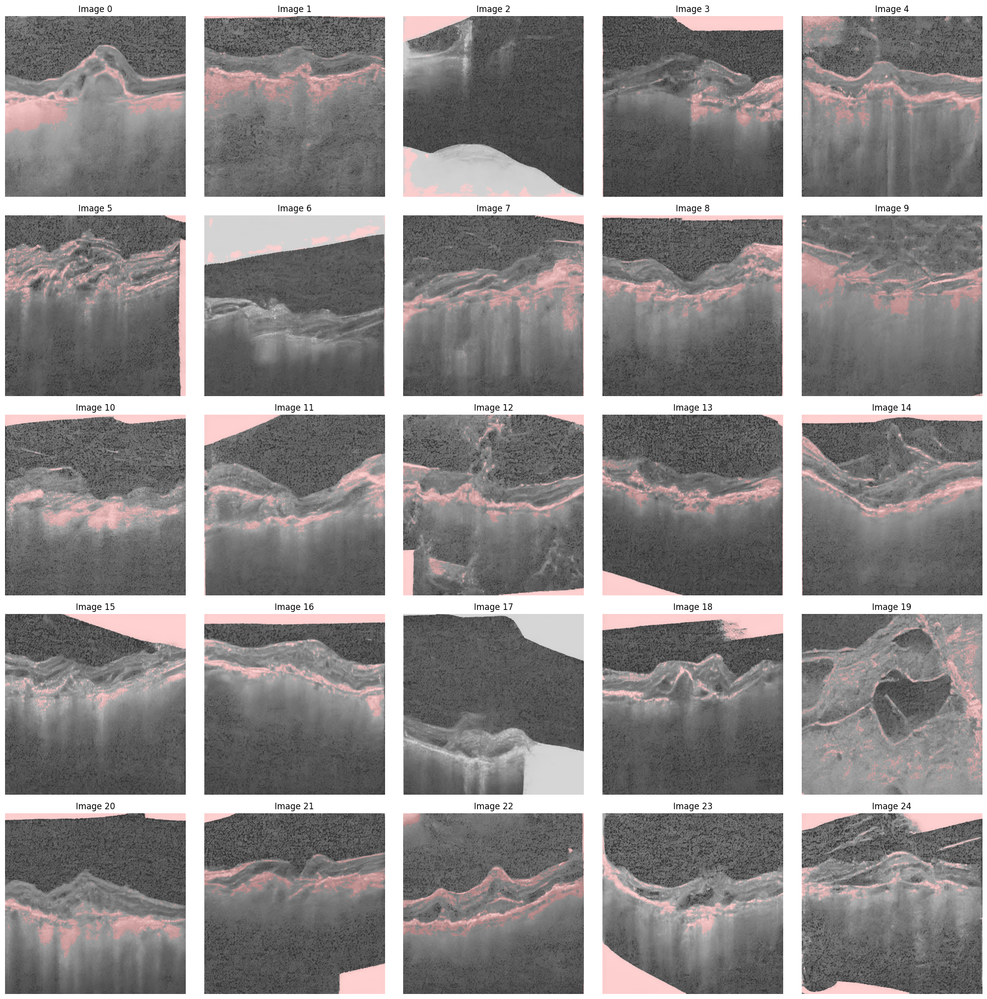

In [25]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import label

def get_cnv_mask(img, threshold_percentile=90, min_region_size=10):
    """
    Generate a binary mask for high-reflectance regions suspected to be CNV features.

    Parameters:
    - img (PIL.Image): Input image (grayscale)
    - threshold_percentile (float): Brightness threshold percentile
    - min_region_size (int): Minimum region size (number of pixels)

    Returns:
    - mask: Binary numpy array (1 for CNV regions, 0 elsewhere)
    """
    # Convert to grayscale (if not already)
    img_gray = img.convert("L")
    img_array = np.array(img_gray)

    # Calculate brightness threshold (top threshold_percentile%)
    threshold = np.percentile(img_array, threshold_percentile)

    # Create mask for high-reflectance regions
    high_reflectance = img_array > threshold

    # Label connected components
    labeled_array, num_features = label(high_reflectance)

    # Filter small regions
    mask = np.zeros_like(high_reflectance, dtype=np.uint8)
    for region_id in range(1, num_features + 1):
        region_mask = labeled_array == region_id
        if np.sum(region_mask) >= min_region_size:
            mask |= region_mask

    return mask

def display_synthetic_images_with_cnv_highlight(
    image_dir="/content/synthetic_cnv/",
    num_images=25,
    rows=5,
    cols=5,
    highlight_color=(255, 0, 0, 128),  # Red with 50% opacity
    threshold_percentile=90,
    min_region_size=10
):
    """
    Display synthetic CNV images in grayscale with high-reflectance regions highlighted in a colored overlay.

    Parameters:
    - image_dir (str): Directory path containing images
    - num_images (int): Number of images to display
    - rows (int): Number of rows in the grid
    - cols (int): Number of columns in the grid
    - highlight_color (tuple): RGBA color for highlight (R, G, B, A)
    - threshold_percentile (float): Brightness percentile for detecting high-reflectance regions
    - min_region_size (int): Minimum region size (number of pixels)
    """
    # Get list of image files
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    image_files.sort()

    if not image_files:
        print(f"Error: No images found in {image_dir}")
        return

    # Limit the number of images to display
    num_images = min(num_images, len(image_files))
    if num_images == 0:
        print("No images to display")
        return

    # Set up the grid
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = axes.ravel() if num_images > 1 else [axes]

    # Load images and add highlight
    for i in range(num_images):
        img_path = os.path.join(image_dir, image_files[i])
        try:
            # Load image in grayscale
            img = Image.open(img_path).convert("L")

            # Get CNV mask
            cnv_mask = get_cnv_mask(img, threshold_percentile, min_region_size)

            # Convert grayscale to RGB for highlighting
            img_rgb = img.convert("RGB")
            img_array = np.array(img_rgb)

            # Create highlight overlay
            highlight = np.zeros((img.height, img.width, 4), dtype=np.uint8)
            highlight[cnv_mask > 0] = highlight_color

            # Convert highlight to PIL Image
            highlight_img = Image.fromarray(highlight, mode="RGBA")

            # Convert base image to RGBA for blending
            img_rgba = Image.fromarray(img_array).convert("RGBA")

            # Blend image with highlight
            blended = Image.blend(img_rgba, highlight_img, alpha=0.2)

            # Display with matplotlib
            axes[i].imshow(blended)
            axes[i].set_title(f"Image {i}")
            axes[i].axis('off')
        except Exception as e:
            print(f"Error loading {img_path}: {e}")
            axes[i].axis('off')

    # Disable empty plots
    for i in range(num_images, rows * cols):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Display synthetic CNV images with highlighted CNV regions
display_synthetic_images_with_cnv_highlight(
    image_dir="/content/synthetic_cnv/",
    num_images=25,
    rows=5,
    cols=5,
    highlight_color=(255, 0, 0, 128),  # Red with 50% opacity
    threshold_percentile=90,
    min_region_size=10
)